# Comparative analysis of LSEG FX tick datafeeds during periods of high market volatility

### Authors: Haykaz Aramyan, Jason Ramchandani, JJ Chalmers

## General Overview

The aim of this research is to analyse the FX data offerings from LSEG – the Blended Rate (TRB), FXAll Pricestream data (FXV) and our contributor data (Super RIC). These data sets have differing methodologies and sources to accommodate for a wide range of use cases and accurately reflect the different market tiers that exist in Foreign Exchange. This means that the LSEG data offering can provide a bespoke fit to our clients’ specific requirements and the markets they operate in to maximise accuracy.

While the Super RIC generally reflects the overall market price with indicative pricing and will serve the needs of most market participants, such as a trader eyeballing the market, the Blended Rate and Pricestream data offers pricing derived from real market activity and offers tick level granularity. These feeds reflect the most accurate price in the market and react instantly in highly volatile periods. This will be important as an input for client pricing calculation, high frequency traders and other market participants who are interested in high frequency price updates both for liquid and illiquid currency pairs.

We will use various metrics, such as mid-price, spreads, and realized variance to compare the data sets and show the strength of the Refinitiv FX data offering during specific times of high volatility. This research will show the users of this data how each data set reacts to a particular market move as well as the picture of the market that each data set displays.

The Article comprises of four main sections. In section 1, we will discuss the differences between Refinitiv FX data venues. Further, we will introduce tick data ingestion and aggregation process for all markets using Refinitiv's latest RD Library API. Section 3 will describe a FX market comparison use-case with a developed market currency, such as EUR and GBP. Finally, we will explore TRB, FXV and Super RIC market movements in emerging markets currencies, such as ZAR and SGD. In this analysis we will show how the Blended Rate and Pricestream data help to avoid the lags during sudden price movements and offer a noiseless pricing feed.


## Section 1: Refinitiv FX markets

#### FX Super RIC (FX=)

The Super RIC is the last price attributed to a specific contributor from a pool of freely available indicative bank/broker contributors that have provided Refinitiv with permission to display their pricing. 
The Super RIC is updated in real time with the last indicative quote price attributed to the specific contributor. Since contributions technology is used, even though it is updated in real-time, the rates might be 100s of milliseconds old by the time it reaches our aggregation system. Pricing is provided on a best endeavours basis using our real time quality algorithms to remove spikes and outliers from contributors, this is not a firm price. The Super RIC will not show major tier 1 bank pricing if they have not given permission to Refinitiv to attribute their pricing.

#### TRB (FX=TRB)

The TRB is the single most comprehensive source of indicative market rates, leveraging the 446bn per day trading volume on Refinitiv venues – ‘Matching’, our tier 1 bank to bank trading venue, and ‘FX All’, the market leading execution and workflow solution for corporate and institutional clients. The composite data is derived from firm orders with no last look pricing – meaning the price data is a truer reflection of the current market. Also included in the blend is indicative data from over 100 banks and interdealer brokers, weighted by importance. The rate covers 64 currency pairs and 4 precious metals. TRB updates in real-time whenever one of the underlying sources updates. Average updates are 500ms across 24 hours, but more like 4-5 per second in busy times and 1 per second in quiet times. It takes an FXall rate every 1 second, and a Matching rate up to every 200ms, plus whenever specific bank and broker contributors update their rates. The mid represents market consensus since it sources from Matching, FXall and trusted bank and Broker.

#### Price Stream ((S=FXV, BS=FXV, CS=FXV)

In addition to the above, Refinitiv also provide =FXV (FXall Price Stream) which is a volume-tiered FX Spot Market reference rates blended from rates of the platform’s top liquidity providers. FXV covers 75+ liquid pairs and aggregates multiple liquidity providers derived from the world’s largest liquidity pool. The FXV updates every 50 milliseconds. Volumes tiers are usually 1M, 5M, 10M base currency quote sizes, except for Metals and a few other non-USD based pairs. This data set also has a higher quote precision – e.g., 5 full decimals for EUR/USD. 3 Regional versions are available if low-latency collection of data is needed =FXVE, =FXVN, =FXVA.

![title](images/FX_markets.png)

## Section 2: Obtaining and aggregating tick data for FX markets

#### Configuration

To acquire tick data for FX we will be using Refinitiv Data(RD) Libraries API. To use the API we first need to configure refinitiv-data.config.json file located in a Configuraion folder  depending on the access channel and connection parameters that needed to connect to the Refinitiv Data Platform. In the scope of this article we will be connected through a desktop session for which an app-key is required. More on the configuration of RD libraries can be found [here](https://github.com/Refinitiv-API-Samples/Example.DataLibrary.Python/tree/main/Configuration).

In [ ]:
import os
os.environ["RD_LIB_CONFIG_PATH"] = "Configuration"

#### Install and import packages

To start, we first install and import the necessary packages.The code are built using Python 3.9. Other prerequisite packages are installed and imported below:

In [ ]:
# !pip install refinitiv.data

In [ ]:
# !pip install pandas

In [ ]:
# !pip install numpy

In [ ]:
# !pip install plotly

In [ ]:
import refinitiv.data as rd

import datetime
from datetime import datetime
from dateutil import parser

import pandas as pd
import numpy as np

import plotly.express as px
from pathlib import Path

After we install and import the required modules we open an RD desktop session to ingest the FX data.

In [ ]:
rd.open_session()

<refinitiv.data.session.Definition object at 0x1047e1d00 {name='workspace'}>

#### Class to Obtain FX Data

Before processing to the fx data ingestion, it should be noted, that currently RD Libraries API provides access to the last 3 month of the tick data, thus all the economic events impacted the fx price and discussed in this article are from the last 3 month. Another limitation of the API is that a single request populates maximum of 10000 rows where the total number of tick data for a day can reach more than a million. Thus, we request the data under a loop by getting and requesting from the latest tick time. The request is wrapped by a try catch statement to avoid data loss if any network error happens during our request.

To ingest FX data, we have built a class with a set of function allowing us not only to request the data from the RD libraries APIs but also conduct several operations to include concatenation and type casting. The ObtainingFXData class comprises of the following functions:
* **__init__** - initializes the input arguments, including the currency, the start, and the end date of the request.
* **get_FX_data** - this is the main function which will be called to trigger the rest of the private functions to ingest, typecast and save the data.
    * **request_data** - this is the function where we make the API request under a try catch statement described above. To ingest the whole tick data during the day we have introduced a while loop which checks whether end datetime of the request is smaller than the start datetime or not. After it equals or exceeds the start datetime we stop the loop. This function itself calls two other functions described below and returns a dataframe of tick data for the requested period.
        * **update_end_date** - this function is intruduced to get the latest end datetime of a single API request and after updating the original end datetime by the latest one passes to the request_data function for another API call.
        * **concat_dfs** - through this function we merge the tick data retrieved in API multiple API calls to return a dataset covering the tick data for the entire requested period.
    * **change_types** - as we are going to conduct several operations with our data we need to make sure those have the required types. This function ensures the type casting of some of the fields in the dataframe, such as date and pricing fields.
    * **save_csv** - since data ingestion for tick data takes relatively long time and requires numerous API request we need to store the data locally not to make the API call every time we analyze it. This function saves the FX dataframe locally in csv format.

In [93]:
class ObtainingFXData:
    
    def __init__(self, fx, start_date, end_date):
        self.fx = [fx]
        self.start_date = parser.parse(start_date).replace(tzinfo=None)
        self.end_date = parser.parse(end_date).replace(tzinfo=None)

    def get_FX_data(self):
        
        print(f'Requesting tick data for {self.fx[0]} for the period {self.start_date} to {self.end_date}')
        response_df = self.__request_data()
        self.__save_csv(self.__change_types(response_df))
        print(f'{response_df.shape[0]} datapoints for {self.fx[0]} are created and stored')
        
        return response_df
        
    def __request_data(self):
        response_df = pd.DataFrame()
        while self.end_date >= self.start_date:
            try:
                df = rd.get_history(universe = self.fx, end = self.end_date, count = 10000, fields = ["BID","ASK","MID_PRICE"],interval = 'tick')
                self.end_date = self.__update_end_date(df)
                response_df = self.__concat_dfs(response_df, df)
            except:
                continue
        
        return response_df
    
    def __update_end_date(self, df):
        self.end_date = df.index.min().replace(tzinfo=None).strftime('%Y/%m/%d %H:%M:%S.%f')
        self.end_date = datetime.strptime(self.end_date,'%Y/%m/%d %H:%M:%S.%f')
        return self.end_date
    
    def __concat_dfs(self, response_df, df):
        if len(response_df):
            response_df = pd.concat([response_df, df], axis=0)
        else:
            response_df = df
            
        return response_df
        
    def __change_types(self, response_df):
        
        response_df.reset_index(inplace = True)
        response_df['Timestamp'] = pd.to_datetime(response_df['Timestamp'])
        response_df['BID'] = pd.to_numeric(response_df['BID'])
        response_df['ASK'] = pd.to_numeric(response_df['ASK'])
        response_df['MID_PRICE'] = pd.to_numeric(response_df['MID_PRICE'])
                                                 
        return response_df
    

    def __save_csv(self, response_df):
        response_df.to_csv(f'{self.fx[0]}.csv')
        

#### Class to Aggegate FX data in defined intervals

To analyze the market movements and the volatility of FX markets and compare the metrics of TRB and the FXV with the Super RIC for different currencies we may have to zoom out and zoom into the tick data. For that we may need to aggregate the tick data into certain intervals and then show differences via plots. For that, we have created an object class called **AggregatedDfWithMetrics** which returns aggregated with a specified interval dataframe of the original dataframe containing tick values. To achieve this the class introduces the following functions:

* **init** -  initializes the input dataframe by triggering a typecasting function below.
    * **change_types** - as we are going to conduct several operations with our data we need to make sure those have the required types. This function ensures the type casting of some of the fields in the dataframe, such as date and pricing fields.
*  **compute_metrics_and_aggregate** -  this is the main function which will be called to trigger the rest of the private functions to compute/add metrics and aggregate the dataframe with the specified intervals. This function takes a ric (str), interval (str) and an origin_time(str) as an input and triggers the following functions:
    * **get_periods** - this function returns an origin and end datetime to be used as origin in grouping functions and as a filtering criterion.
    * **filter_by_origin** - when retrieving daily data through updating end datetime we get tick values belonging the previous day as well. Additionally, we may want to aggregate our data from a secific datetime. We use this function to return a dataframe of tick values belonging after a specified origin datetime.
    * **add_spread_and_middiff** - this function computes spreads and mid price differences and adds them to the main dataframe. We calculate this metrics separately from the main metrics as we need those as an input for calculating the rest of the metrics.
    * **group_elements** - this functions returns four dataframes which are grouped by count, maximum, minimum and variance measures. Further, we use these dataframes to calculate a range of metrics. Before calculating those metrics, we first create an aggregated dafarame by grouping the elements by average value. Finally, we pass this and the rest of returned dataframes to the function calculate_and_add_metrics.
    * **calculate_and_add_metrics** - this function calculates and adds the final metrics to the main dataframe to include number of ticks per interval, mid price return variance, maximum, minimum and range spread  of the interval.

In [ ]:
class AggregatedDfWithMetrics:
    def __init__(self, df):
        self.df = self.__change_types(df)
    
    def compute_metrics_and_aggregate(self, ric, interval, origin_time, end_time):
        origin, end = self.__get_periods(origin_time, end_time)
        filtered_df = self.__filter_by_origin(origin, end)
        self.__add_spread_and_middiff(filtered_df)
        count_df, max_vals_df, min_vals_df, var_df = self.__group_elements(filtered_df, interval, origin)
        aggregated_df = filtered_df.groupby(pd.Grouper(key = 'Timestamp', freq = interval, origin = origin)).mean()
        self.__calculate_and_add_metrics(aggregated_df, count_df, max_vals_df, min_vals_df, var_df)
        
        return aggregated_df.add_suffix(f'_{ric}')
        
    def __get_periods(self, origin_time, end_time):
        date = self.df['Timestamp'].iloc[0].strftime("%Y-%m-%d")[:10]
        origin = pd.to_datetime(f'{date} {origin_time}.370000+00:00')
        end = pd.to_datetime(f'{date} {end_time}.370000+00:00')
        return origin, end
    
    
    def __filter_by_origin(self, origin, end):
        self.df = self.df.loc[(self.df['Timestamp'] > origin) & (self.df['Timestamp'] < end)].sort_values(by = 'Timestamp')
        return self.df
        
        
    def __group_elements(self, filtered_df, interval, origin):
        count_df = filtered_df.groupby(pd.Grouper(key = 'Timestamp', freq = interval, origin = origin)).count()
        max_vals_df = filtered_df.groupby(pd.Grouper(key = 'Timestamp', freq = interval, origin = origin)).max()
        min_vals_df = filtered_df.groupby(pd.Grouper(key = 'Timestamp', freq = interval, origin = origin)).min()
        var_df = filtered_df.groupby(pd.Grouper(key = 'Timestamp', freq = interval, origin = origin)).var()
        
        return count_df, max_vals_df, min_vals_df, var_df
    
    def __add_spread_and_middiff(self, filtered_df):
        filtered_df['SPREAD'] = filtered_df['ASK'] - filtered_df['BID']
        filtered_df['diff_mid'] = filtered_df['MID_PRICE'].diff()
        
        return filtered_df 
    
    def __calculate_and_add_metrics(self, aggregated_df, count_df, max_vals_df, min_vals_df, var_df):
        aggregated_df['COUNT'] = count_df['MID_PRICE']
        aggregated_df['MAX_SPREAD'] = max_vals_df['SPREAD']
        aggregated_df['MIN_SPREAD'] = min_vals_df['SPREAD']
        aggregated_df['RANGE_SPREAD'] = aggregated_df['MAX_SPREAD'] - aggregated_df['MIN_SPREAD']
        aggregated_df['VAR_MID_DIFF'] = var_df['diff_mid']
        
        return aggregated_df
    
    def __change_types(self, df):
        df.reset_index(inplace = True, drop = True)
        df['BID'] = pd.to_numeric(df['BID'])
        df['ASK'] = pd.to_numeric(df['ASK'])
        df['MID_PRICE'] = pd.to_numeric(df['MID_PRICE'])
        df['Timestamp'] = pd.to_datetime(df['Timestamp'])
        
        return df

## Section 3: Use case with Developed market currencies: Case with EUR and GBP

Given that developed and emerging market currencies may respond differently to the economic events in terms of accurate and non-latent reflection of the new information in the price, we will introduce cases for both currency markets. This will ensure robustness of comparison differences between TRB and the FXV with the Super RIC during times of high market movement and volatility. 

In this section, we will compare TRB and the FXV with the Super RIC for developed market currencies, such as EUR and GBP and show the accuracy of the data during times of high market movement and volatility caused by the economic events.

### Case with EUR: EUR Slides Below Dollar

![title](images/EUR_below_USD_news.png)

For this case we will investigate how the abovementioned economic event impacted the different FX markets for EUR.

#### Requesting tick data for EUR

Now, let's request FX data for EUR for different FX markets, including Super RIC, TRB and FXVs (AS, BS, CS). Below we initialize RIC/rics, start and end datetime of the request as well as an empty dictionary where will store dataframes for each FX market.

In [94]:
RIC = 'EUR'
rics = [f'{RIC}=', f'{RIC}=TRB', f'{RIC}AS=FXV', f'{RIC}BS=FXV', f'{RIC}CS=FXV']
start = '2022-07-14T00:00:00Z'
end = '2022-07-14T23:59:00Z'
fx_dict = {}

Below, we first check whether we have the data already stored in our downloads folder or not. If not, we make an API call using Refinitiv RD Library.

In [95]:
for ric in rics:
    df_name = ric.split('=')[0]+'_'+ric.split('=')[1]
    path = Path(f'downloads/EUR_1407/{ric}.csv')
    if path.is_file():
        fx_dict[df_name] = pd.read_csv(f'downloads/EUR_1407/{ric}.csv', index_col=[0])
    else:
        fx_dict[df_name] = ObtainingFXData(ric, start, end).get_FX_data()        

#### Aggregating tick Data

Next, we aggregate the tick data in 5 minute intervals to analyze the market movements and the volatility of different FX markets. For that, we intialize an empty dictionary and call **compute_metrics_and_aggregate** function from **AggregatedDfWithMetrics** class for each market and store aggregated dataframes in that dictionary.

Since we are dealing here with a highly liquid currency, we will aggregate our tick data in 1-minute intervals. Additionally, let us zoom into about +-10 minutes from the actual market movement.

In [96]:
fx_dict_interval = {}
for df, ric in zip(fx_dict, rics):
    fx_dict_interval[df+'interval'] = AggregatedDfWithMetrics(fx_dict[df]).compute_metrics_and_aggregate(ric, '1min', '13:14:12', '13:35:33')

Now, let's illustrate line graphs for Mid Price, spread and realized variance, for which we have introduced a Plot object.

#### Plotting the results

Finally, we plot some of the metrics for each market for comparative analysis. For that we have built a class named **Plot** which takes the dictionary of fx dataframes (with aggregated intervals), list of rics and metrics for initialization and plots comparison line graphs for each metric. The class comprises of the following private functions:
* **init** - this is constructor function which initializes the input arguments.
* **plot_graph** - this is the main function which creates the merged dataframe and plots line graph for each metric. This function is triggering the following functions to achieve that:
    * **merge_dfs_and_add_spread_diff** - this function merges all dataframes from the input dictionary and adds column with calculated spread differences.
        * **calculate_spread_diffs** - this function calculates spread differences between each FX market
    * **filter_df_by_metric** - this function filters the merged dataframe by a specified metric.


In [97]:
class Plot:
    def __init__(self, df_dict, rics, metrics):
        self.df_dict = df_dict
        self.rics = rics
        self.metrics = metrics
        
    def plot_graph(self):
        final_df = self.__merge_dfs_and_add_spread_diff()
        for metric in self.metrics:
            df_metric = self.__filter_df_by_metric(final_df, metric)
            fig = px.line(df_metric, x=df_metric.index, y=df_metric.columns)
            fig.update_layout(height=600, width=1000, legend=dict())
            fig.show()      
        
    def __merge_dfs_and_add_spread_diff(self):
        merged_df = pd.concat(self.df_dict.values(), axis=1, join="outer")
        final_df = self.__calculate_spread_diffs(merged_df)
        return final_df  
    
    def __filter_df_by_metric(self, final_df, metric):
        return final_df.filter(regex=f'^{metric}')       
    
    def __calculate_spread_diffs(self, merged_df):
        for ric in self.rics[1:]:
            merged_df[f'spread_diff_{ric}_{rics[0]}'] = merged_df[f'SPREAD_{ric}'] - merged_df[f'SPREAD_{rics[0]}']
        return merged_df

Below, we specify the metrics for which we want to show a plot and call **plot_graph** function from the **Plot** object.

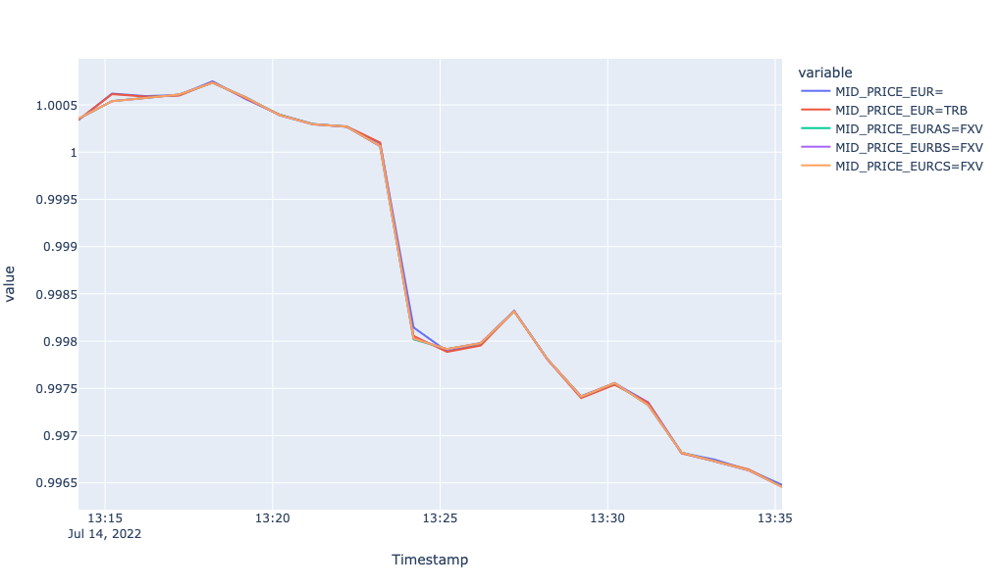

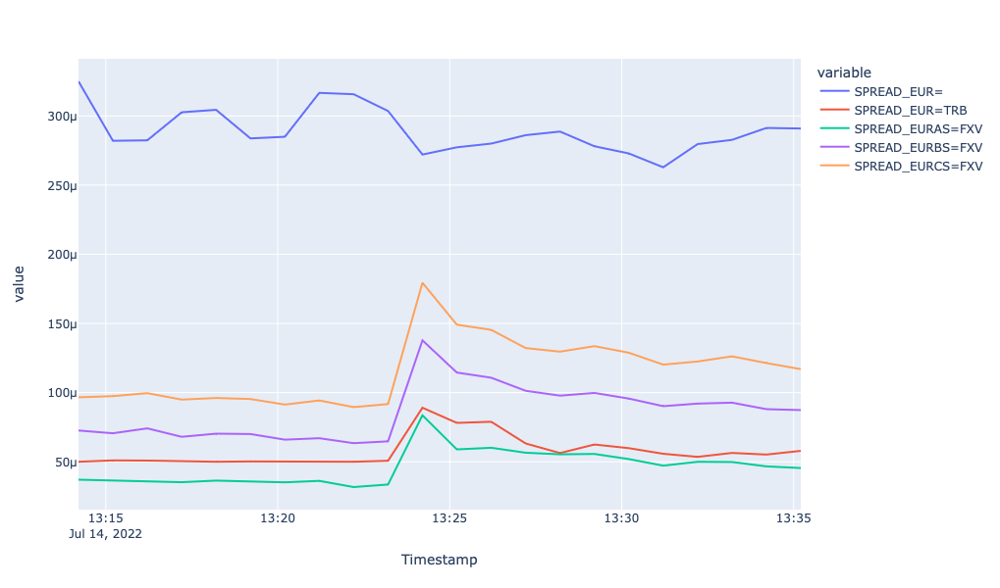

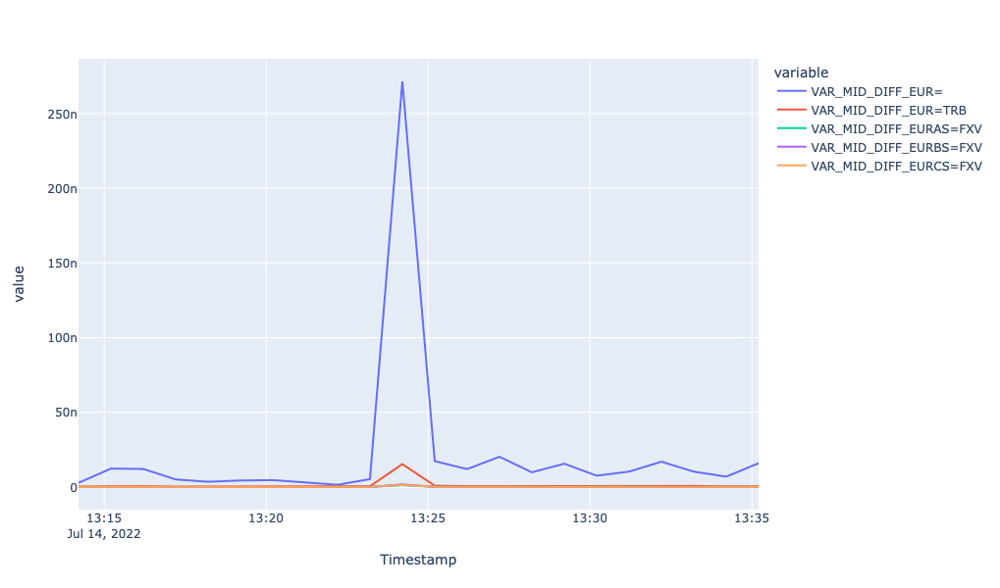

In [98]:
metrics = ['MID_PRICE', 'SPREAD', 'VAR']

Plot(fx_dict_interval, rics, metrics).plot_graph()

By looking at the line plots above we observe the highest spread for the Super RIC and lowest for EURAS. Apart from the difference in the size of the spread, we observe that both TRB and FXV feeds respond better to the market event. Particularly the spreads for those pairs widen during the sudden price change and stabilizes back afterwards. Whereas the spread for the Super RIC remains stale during the observation period. When it comes to different FXV tiers and TRB, we observe wider spreads as volume tier in FXV increases. EUR=TRB responds to the event by widening the spread at 13:24:12. The spread for the latter is above EURAS=FXV due to the highest spread of EUR= (as it is sourced from the Super RIC as well).

This assertion is further evidenced by looking at the realized variance plot of different FX markets. The realized variance plot shows how realized variance of mid-price returns for Super RIC and TRY=TRB spike during the economic event suggesting that the event is reflected after a certain lag in those markets. The plot for Mid-price fails to highlight the lagged reflection of new information, again, perhaps, because of aggregation.

To see that, let us zoom into the event using tick level prices from about +- 15 second from the actual market movement.

#### Zooming into the event tick level

Now, let's zoom into the time of the economic event and observe the mid prices and spreads in tick level. To filter our original tick level dataframes by the specified periods and add the comparison metrics an object class **Filterdf** is created. The class returns the filtered dataframe by utilizing the following functions:
* **init** -  this is a constructor function which initializes the list of RICs.
* **get_filtered_df** - this is the main function which takes the original tick dataframe, RIC and start and end datetime of the economic event as an input and returns the filtered dataframe by also adding the spread, Mid price return and realized variance metrics. The function triggers the following functions:
    * **compute_and_add_metrics** - as the name indicates, this function calculates and adds column for spread, Mid price return and the realized variance.
    * **add_name_suffix** - this function appends the column names by the respective RIC. To avoid adding the suffix to the Timestamp we set it as index, which further enables the concatenation.
    * **filter_df** - finally, as we have our dataframe with required columns ready we apply the filtering using this function.

In [99]:
class Filterdf:
    
    def __init__(self, rics):
        self.RICs = rics
        self.fitered_df = {}
    
    def get_filtered_df(self, fx_dict, start_time, end_time):
        for df, ric in zip(fx_dict, self.RICs):
            self.fitered_df[df] = self.compute_and_add_metrics(fx_dict[df])
            self.fitered_df[df] = self.add_name_suffix(self.fitered_df[df], ric)
            self.fitered_df[df] = self.filter_df(self.fitered_df[df], start_time, end_time)
        return self.fitered_df

    def filter_df(self, fx_df, start_time, end_time):
        date = str(fx_df.index[0])[:10]
        fx_df = fx_df.loc[( pd.to_datetime(fx_df.index) > pd.to_datetime(f'{date} {start_time}.000000+00:00')) & ( pd.to_datetime(fx_df.index) < pd.to_datetime(f'{date} {end_time}.000000+00:00'))]
        fx_df = fx_df.loc[~fx_df.index.duplicated(keep='first')].sort_values(by = 'Timestamp')
        return fx_df
    
    def compute_and_add_metrics(self, fx_df):
        fx_df['SPREAD'] = fx_df['ASK']-fx_df['BID']
        fx_df['MID_DIFF'] = fx_df['MID_PRICE'].diff()
        fx_df['VAR'] = fx_df['MID_DIFF'].var()
        return fx_df
    
    def add_name_suffix(self, fx_df, ric):
        fx_df['Timestamp'] = pd.to_datetime(fx_df['Timestamp'])
        fx_df = fx_df.set_index('Timestamp')
        fx_df.index = fx_df.index.astype('object')
        fx_df = fx_df.add_suffix(f'_{ric}')
        return fx_df

In [ ]:
fx_dict = Filterdf(rics).get_filtered_df(fx_dict, '13:24:00', '13:24:33')

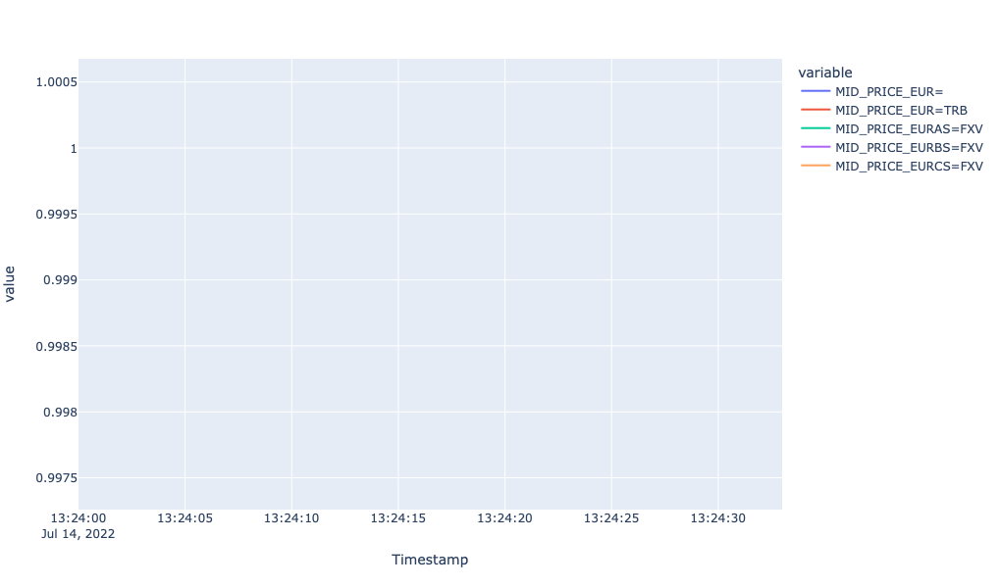

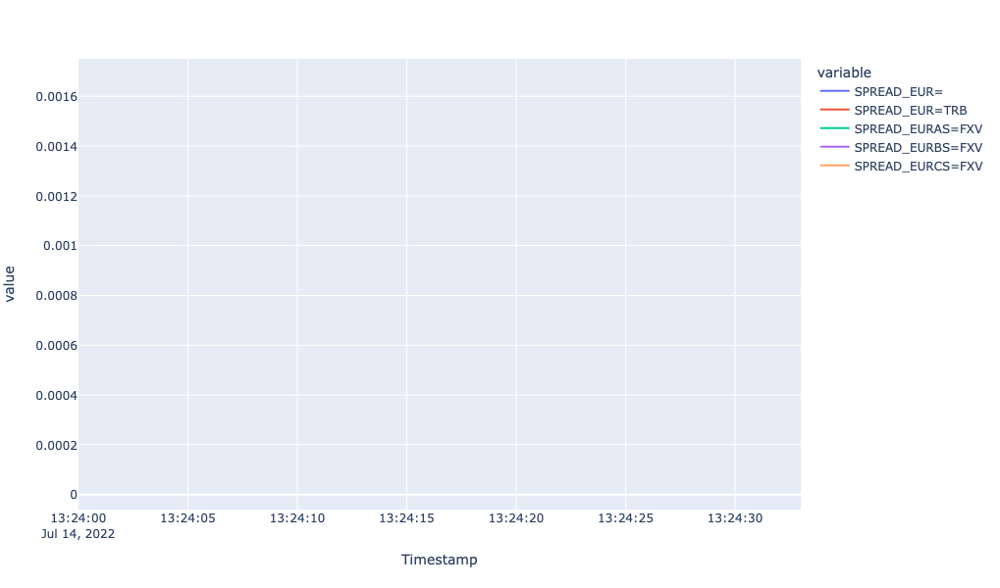

In [73]:
metrics = ['MID_PRICE', 'SPREAD']

Plot(fx_dict, rics, metrics).plot_graph()

What we can see while looking at the first plot is the fastest response by all FXV feeds and lagged response to the market event by EUR=. Particularly, the FXVs had a steep decline at 13:24:14, whereas the Super RIC reflected the new market environment at 13:24:19 only. Furthermore, the mid-price for the Super RIC carries a lot of noise with many high up and down spikes capturing the actual market condition at 13:24:30. We also observe 1 second lagged response by EUR=TRB, however it could capture the market movement throughout the observation period.

We provide zoomed plot for the Spreads for EUR currency pairs as well. This shows the widening spread for FXVs with large spikes at the beginning of the event, whereas spreads for EUR= remains stale (carrying a lot of noise after the event) throughout the period.

Now, let us investigate another developed currency market - GBP- and observe if we see similar responses by different currency feeds there as well.


### Case with GBP: GBP Jumped after lower-than-expected US CPI

![title](images/GBP_news.png)

For this case we will investigate how report on US CPI moved GBP market, in this case upwards compared to the downward move in EUR. For that, let's initialize RIC/rics, start and end datetime of the requests and an empty dictionary to store requested dataframes.

In [74]:
RIC = 'GBP'
rics = [f'{RIC}=', f'{RIC}=TRB', f'{RIC}AS=FXV', f'{RIC}BS=FXV', f'{RIC}CS=FXV']
start = '2022-08-10T00:00:00Z'
end = '2022-08-10T23:59:00Z'
fx_dict = {}

Below, we first check whether we have the data already stored in our downloads folder or not. If not, we make an API call using Refinitiv RD Library.

In [75]:
for ric in rics:
    df_name = ric.split('=')[0]+'_'+ric.split('=')[1]
    path = Path(f'downloads/GBP_1008/{ric}.csv')
    if path.is_file():
        fx_dict[df_name] = pd.read_csv(f'downloads/GBP_1008/{ric}.csv', index_col=[0])
    else:
        fx_dict[df_name] = ObtainingFXData(ric, start, end).get_FX_data()        

Here again, since we are dealing here with a highly liquid currency, we will aggregate our tick data in 1-minute intervals. Additionally, let us zoom into the event from about +-10 minutes from the actual market movement.

In [76]:
fx_dict_interval = {}
for df, ric in zip(fx_dict, rics):
    fx_dict_interval[df+'interval'] = AggregatedDfWithMetrics(fx_dict[df]).compute_metrics_and_aggregate(ric, '1min', '12:18:47', '12:38:33')

Finally, let's call plot_graph function from the Plot object to illustrate line graphs for Mid Price, spread and realized variance.

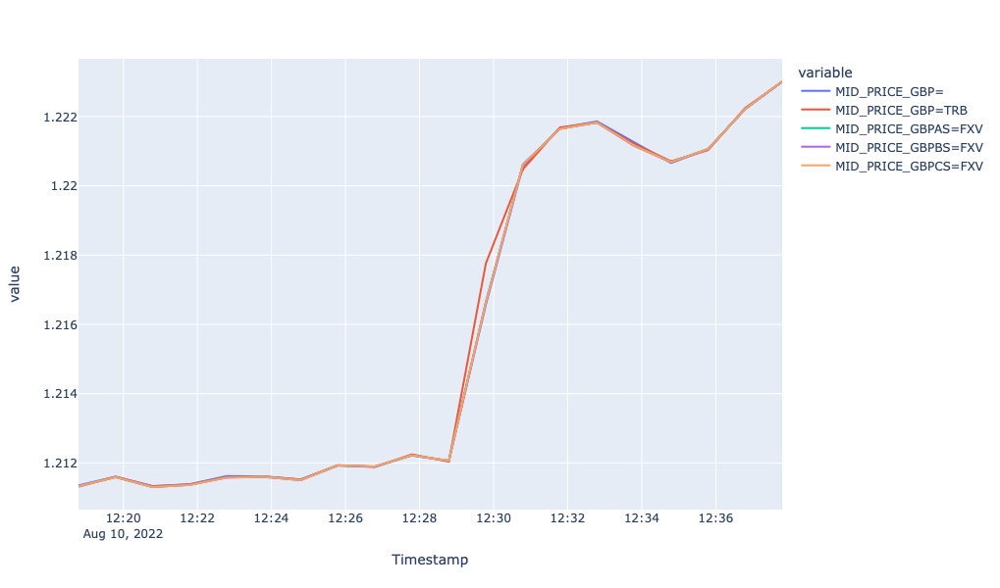

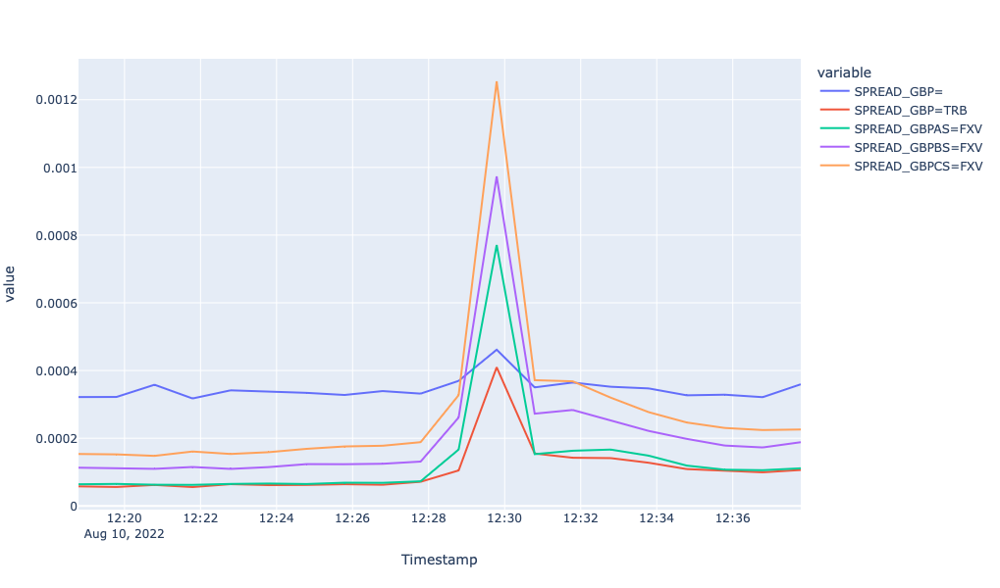

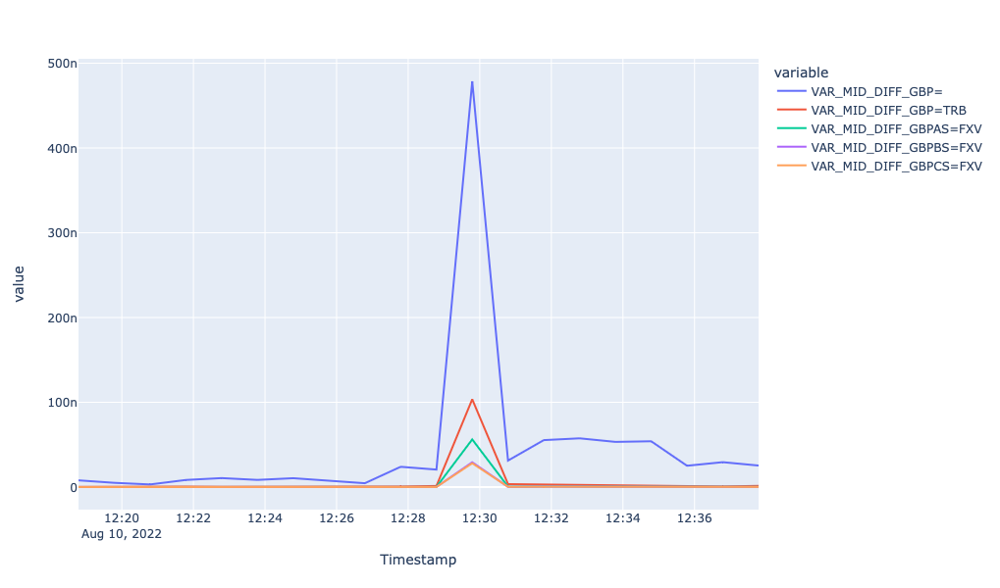

In [77]:
metrics = ['MID_PRICE', 'SPREAD', 'VAR']

Plot(fx_dict_interval, rics, metrics).plot_graph()

The plots above show a similar picture we had for EUR with a couple of differences. Starting from the similarities, we can observe that all spreads widen at the start of the economic event, the largest volume tier FXV with the widest spreads. The difference with the EUR plot is that the mid price for the Super RIC for GBP, although weak, but responded the market event. Additionally spread for the Super RIC was lower than the FXVs during the event and bigger before and after.

As it comes to the realized variances, we experience similar patterns compared to the EUR variances. Particularly we observe the highest realized variance of mid-price returns for the super RIC and the lowest for GBPCS=FXV.

Overall, for GBP as well we observe FXVs reflect the market condition best, whereas the Super RIC experiences a lag in reflecting the actual market environment.

Finally, let us zoom into the event using tick level prices from about +- 15 seconds from the actual market movement to explore the potential lagged responses.

In [79]:
fx_dict = Filterdf(rics).get_filtered_df(fx_dict, '12:29:45', '12:30:15')

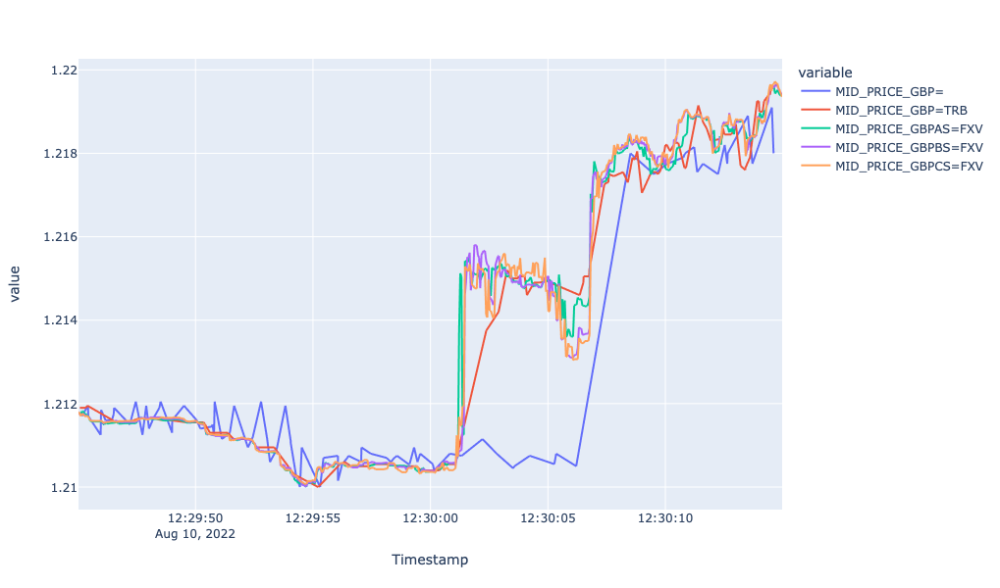

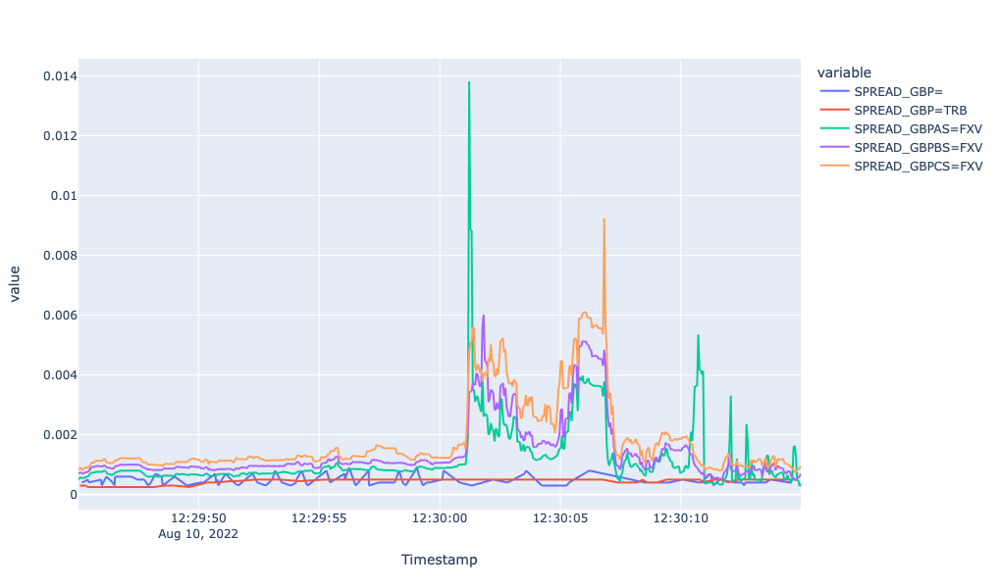

In [80]:
metrics = ['MID_PRICE', 'SPREAD']

Plot(fx_dict, rics, metrics).plot_graph()

The Mid price plot for GBP markets show very similar picture to EUR markets. Particularly we observe 5 and 2 second lagged response by the Super RIC and GBP=TRB, respectively. Moreover, the Super RIC missed the market up and correction during 12:30:01 and 12:30:06 and followed the general market trend starting from 12:30:08.

This analysis of the different feeds of developed market currencies leads to the conclusion that FXVs best respond and reflect the sudden changing market condition. TRB reflects the market event with a couple of seconds lag, whereas the Super RIC offers much larger lag and sometimes misses the actual market environment during the periods of high volatility.

## Section 4: Use case with emerging markets currency - Case with ZAR and SGD

After discussing how different currency feeds from developed markets reflect the sudden price movements caused by economic events, in this section, we will compare TRB and the FXV with the Super RIC for emerging market currencies. Particularly we will investigate ZAR (South African Rand) and SGD (Singapore Dollar) and show how well different market feeds reflect the market conditions during the times of high market movement and volatility caused by the economic events.

### Case with ZAR: African rand and stocks strengthen as dollar on back foot

![title](images/ZAR.png)

Let us start the analysis of emerging market currencies from ZAR. ZAR, after a negative dip at around 13:30 recovered and closed 0.36% up amid news on a possible cooling of US CPI. In this study, we will delve into that negative move and will analyse how different currency market feeds responded to the day's volatility caused by the news. Now, let's request FX data for ZAR for different FX markets, including Super RIC, TRB and FXVs.

Below we initialize RIC/rics, start, and end datetime of the request as well as an empty dictionary where will store dataframes for each FX market.

In [81]:
RIC = 'ZAR'
start = '2022-11-15T00:00:00Z'
end = '2022-11-15T23:59:00Z'

rics = [f'{RIC}=', f'{RIC}=TRB', f'{RIC}AS=FXV', f'{RIC}BS=FXV', f'{RIC}CS=FXV']
fx_dict = {}

In [82]:
for ric in rics:
    df_name = ric.split('=')[0]+'_'+ric.split('=')[1]
    path = Path(f'downloads/ZAR_1511/{ric}.csv')
    if path.is_file():
        fx_dict[df_name] = pd.read_csv(f'downloads/ZAR_1511/{ric}.csv', index_col=[0])
    else:
        fx_dict[df_name] = ObtainingFXData(ric, start, end).get_FX_data()        

Next, let us aggregate the tick data in 5-minute intervals to analyse the market movements and the volatility of different FX markets.

In [83]:
fx_dict_interval = {}
for df, ric in zip(fx_dict, rics):
    fx_dict_interval[df+'interval'] = AggregatedDfWithMetrics(fx_dict[df]).compute_metrics_and_aggregate(ric, '5min', '12:00:00', '15:00:00')

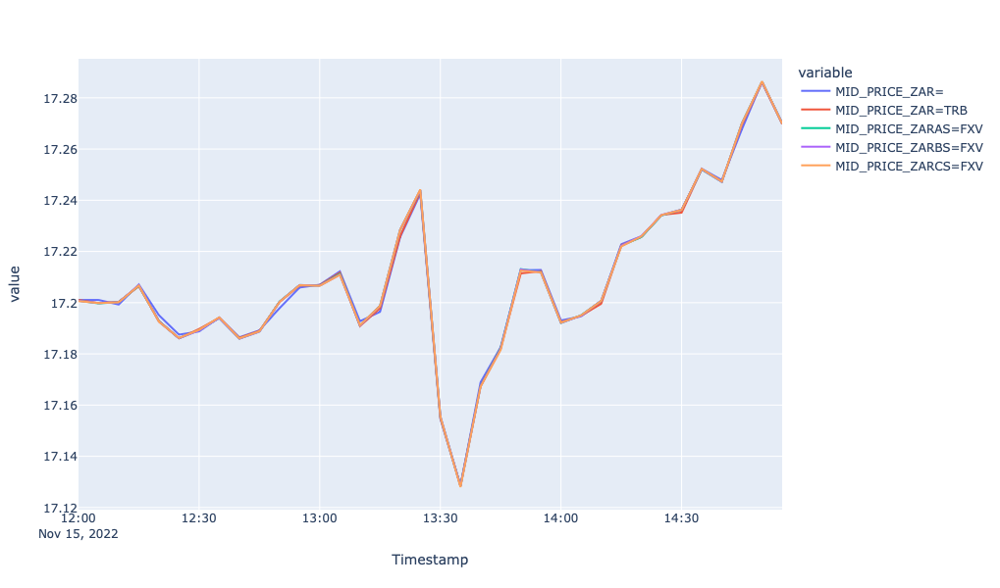

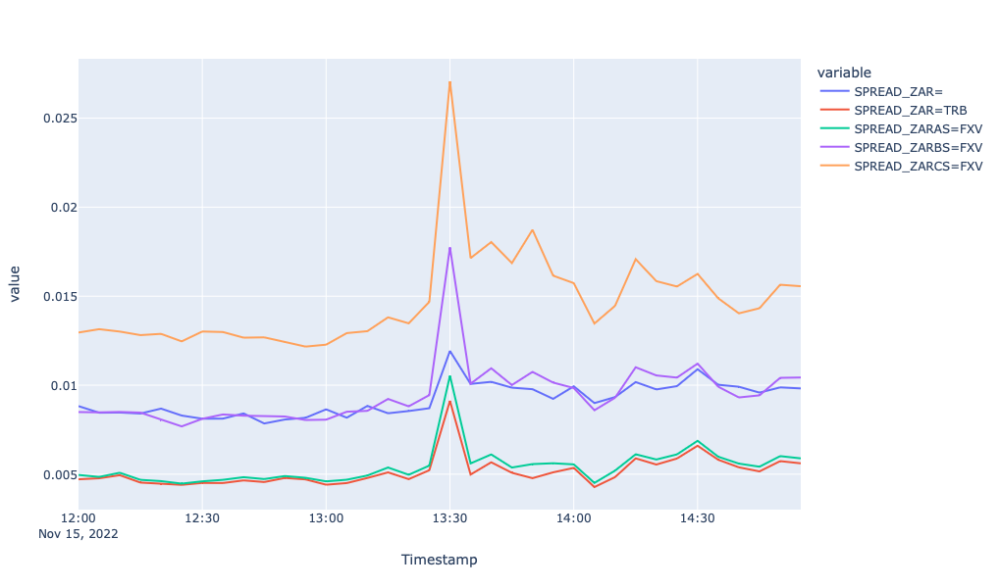

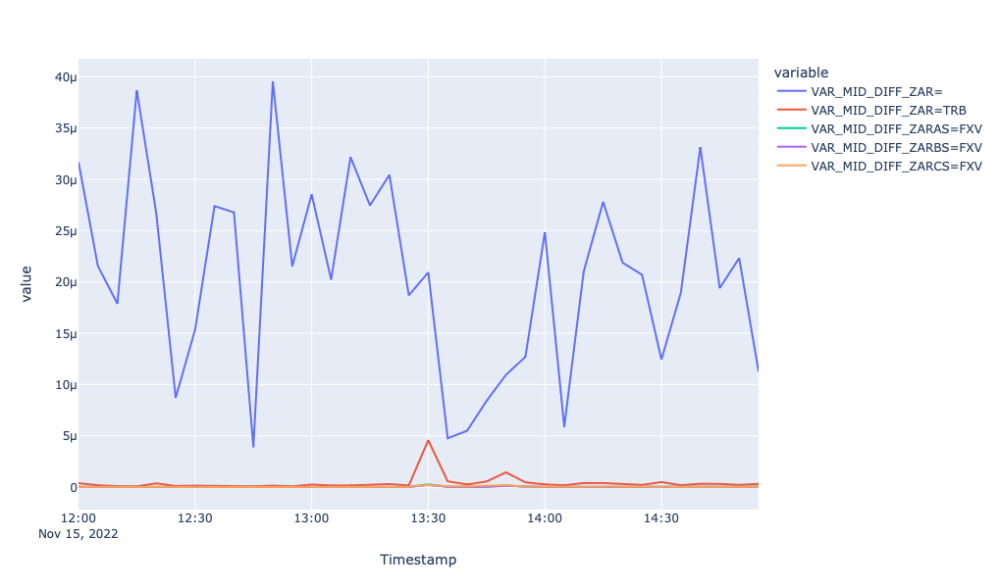

In [84]:
metrics = ['MID_PRICE', 'SPREAD', 'VAR']

Plot(fx_dict_interval, rics, metrics).plot_graph()

The first plot showing mid-price movement in different FX markets shows the trendline of the price for the 15th of November. We observe a negative move at around 13:25 and bounce back after about 10 minutes. To measure how well each of the markets responded to this move let us investigate spread and realized variance graphs during that time.

From the Spread plots, we see that all the markets responded to the market event by widening the spreads, moreover the spreads are wider for FXVBC and FXVCS. Although the spreads of Super RIC also responded to the market move, the variance plot suggests much higher and unstable variance compared to the rest of the feeds, suggesting more noise in the Super RIC feed compared to TRB and FXV feeds.

Despite the noise, we could not identify a lag in 5-minute aggregation, so let us now zoom into the event using tick level prices.

Below, we initialize Filterdf class by requesting tick data from about +-1 minute from the time the event started to move the market.

In [85]:
fx_dict_filtered = Filterdf(rics).get_filtered_df(fx_dict, '13:29:30', '13:31:30')

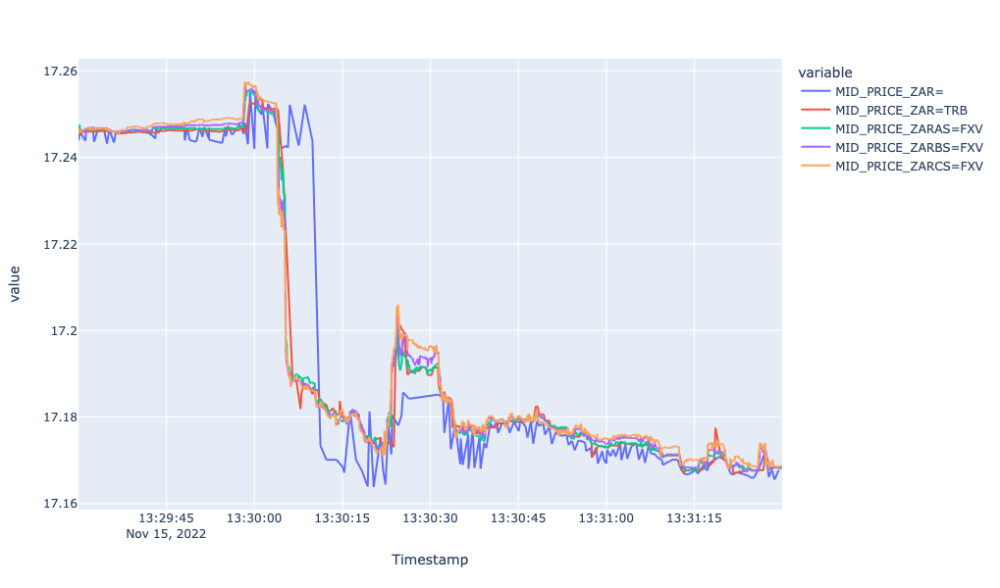

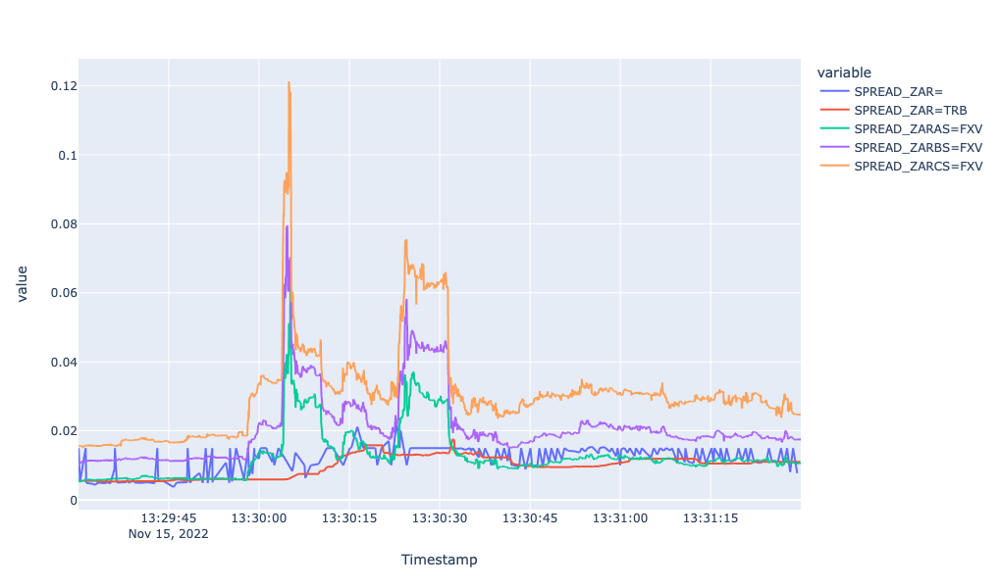

In [86]:
metrics = ['MID_PRICE', 'SPREAD']
Plot(fx_dict_filtered, rics, metrics).plot_graph()

The zoomed in Mid price data confirms the noise in Super RIC and identifies about 5 second lag between 13:30:03 and 13:30:08. When it comes to the Spread plot, it shows the widening spreads for FXVs during the time of the economic event and stale behaviour from the Super RIC and TRB for the same period. So, here again, the FXV feeds captured the market environment best.

Finally, let us investigate another developed market currency - Singapore Dolar (SGD)- to see if can reveal more insights from the emerging market currency feeds.

### Case with SGD: SGD tepid as investors brace for U.S. inflation

![title](images/SGD.png)

SGD after a positive spike at noon closed 0.1% down amid a much-awaited U.S. inflation reading for cues on further rate hikes. In this case with SGD, we will analyse how different currency market feeds responded to the day's volatility caused by the news. Now, let us request FX data for SGD for different FX markets, including Super RIC, TRB and FXVs. Below we initialize RIC/rics, start and end datetime of the request as well as an empty dictionary where will store dataframes for each FX market.

In [87]:
RIC = 'SGD'
start = '2022-10-13T00:00:00Z'
end = '2022-10-13T23:59:00Z'

rics = [f'{RIC}=', f'{RIC}=TRB', f'{RIC}AS=FXV', f'{RIC}BS=FXV', f'{RIC}CS=FXV']
fx_dict = {}

In [88]:
for ric in rics:
    df_name = ric.split('=')[0]+'_'+ric.split('=')[1]
    path = Path(f'downloads/SGD_1310/{ric}.csv')
    if path.is_file():
        fx_dict[df_name] = pd.read_csv(f'downloads/SGD_1310/{ric}.csv', index_col=[0])
    else:
        fx_dict[df_name] = ObtainingFXData(ric, start, end).get_FX_data()

Next, let us aggregate the tick data in 5-minute intervals to analyse the market movements and the volatility of different FX markets.

In [89]:
fx_dict_interval = {}
for df, ric in zip(fx_dict, rics):
    fx_dict_interval[df+'interval'] = AggregatedDfWithMetrics(fx_dict[df]).compute_metrics_and_aggregate(ric, '5min', '09:00:00', '16:00:00')

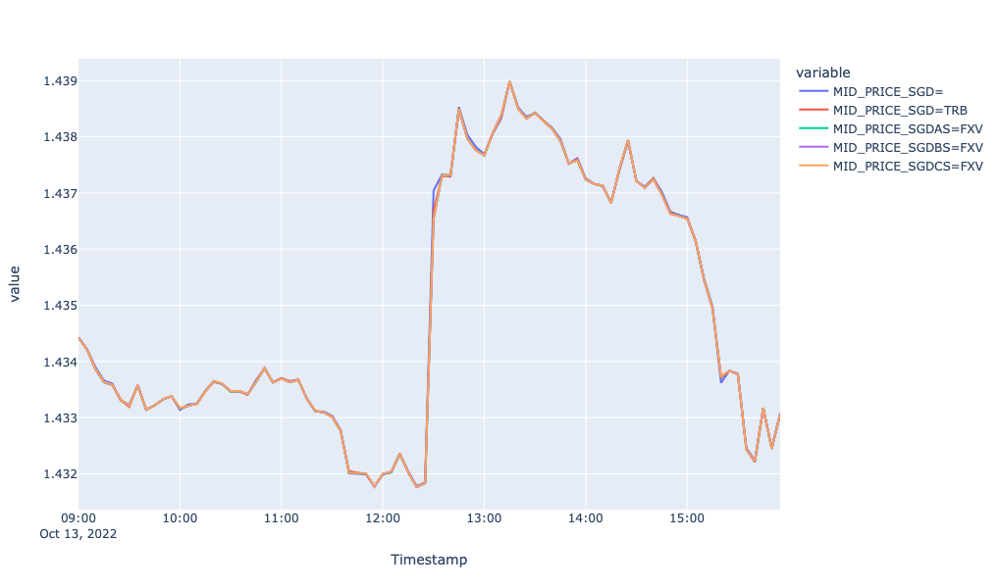

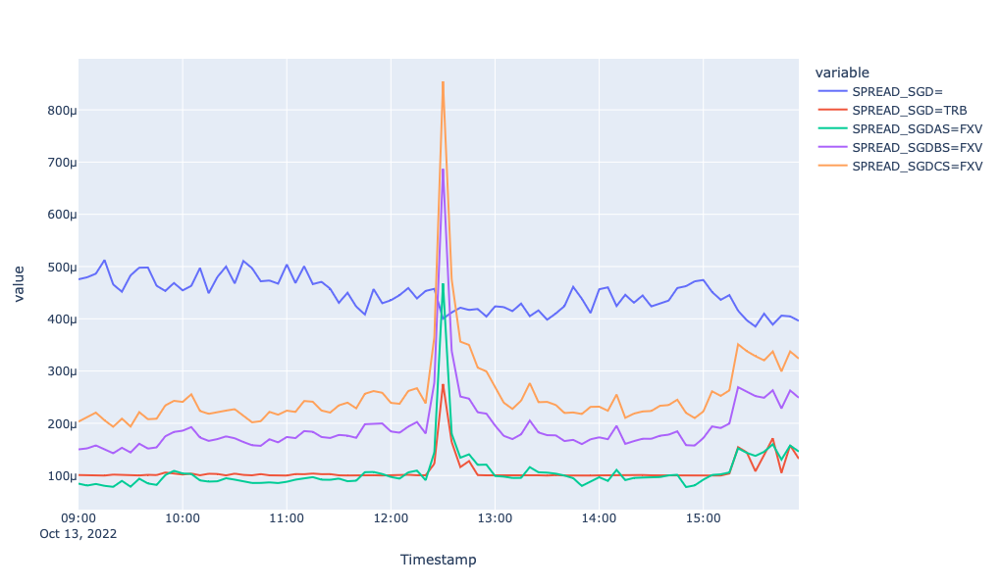

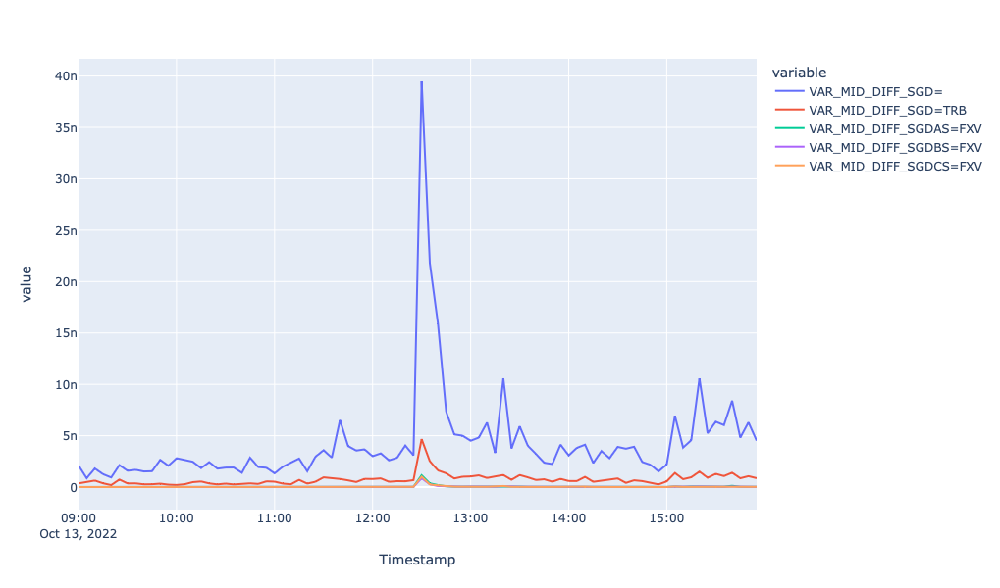

In [90]:
metrics = ['MID_PRICE', 'SPREAD', 'VAR']

Plot(fx_dict_interval, rics, metrics).plot_graph()

The first plot showing mid-price movement in different FX markets shows the trendline of the price for the 13th of October. We observe the impact of the economic event on the prices around 12:28 when the prices increased 0.5% during the following 40 minutes and decreased during the rest of the day, overall decreasing 0.1%. To measure how well each of the markets responded to this move let us investigate spread and realized variance graphs.

From the Spread plots, we see similar picture to EUR, where FXV and TRB feeds responded to the market event by widening the spreads, whereas the spread for the Super RIC remain stale and responded to the event with a lag. The latter is well seen in the Variance plot, where the realized variance for the Super RIC mid-price spiked about 8 times.

To confirm the lagged information response, let's zoom into the event using tick level prices as the plot for Mid-price above fails to highlight the lagged reflection of new information, perhaps, because of the 5-minute aggregation.

Below, we initialize Filterdf class by requesting tick data from about +-1 minute from the time the event started to move the market.

In [91]:
fx_dict_filtered = Filterdf(rics).get_filtered_df(fx_dict, '12:29:00', '12:31:00')

Next, we call plot_graph function from the Plot object to illustrate line graphs for Mid Price and the spread.

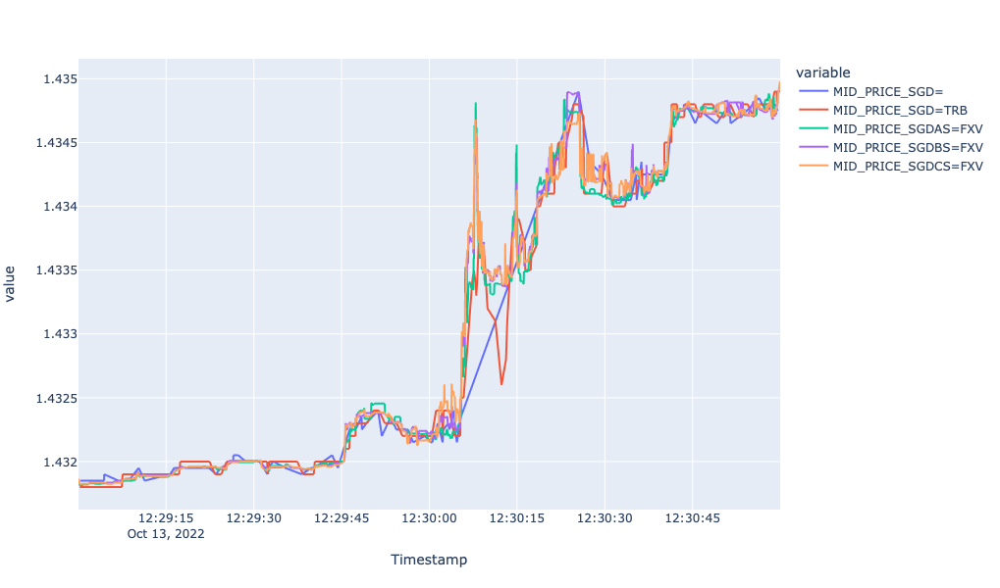

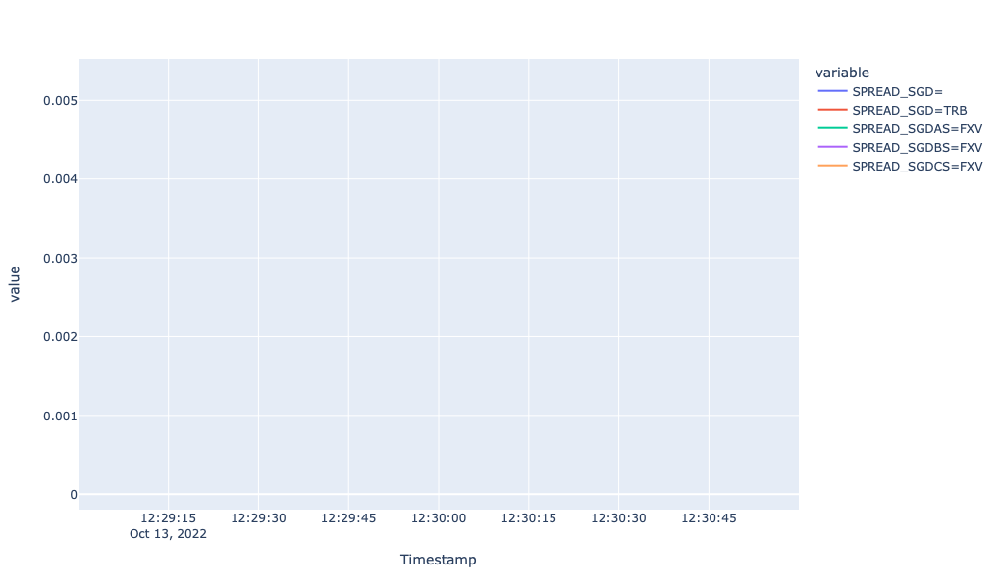

In [92]:
metrics = ['MID_PRICE', 'SPREAD']
Plot(fx_dict_filtered, rics, metrics).plot_graph()

What we can observe from the Mid-Price plot is that Super RIC misses more than 400 ticks during the 20 seconds between 12:30:05 and 12:30:25, where the rest of the markets experience several ups and downs. The granularity offered here by FXV and TRB feeds can be an immense value for the high frequency traders and other market participants interested in fastest possible market price updates. It is worth also highlighting, that although the TRB copes with the market, it offers a little bit of a noise and latency compared to the FXVs.

We provide a zoomed plot for the Spreads as well, which shows the widening spreads for FXVs during the time of the economic event. Additionally, we can observe stale behaviour from the Super RIC and TRB. The latter is perhaps because TRB is mix from FXVAS and the Super RIC itself - the latency of which during highly volatile periods impacts the overall behaviour of the TRB as well.

## Conclusion

We have demonstrated how one can analyse any FX pair using zoomed-out/aggregated data to show performance across longer timeframes – or using zoomed-in/tick data to show performance across very small timeframes. We have provided the code to conduct this efficiently for any relevant currency pair. We set about testing the reactions of both developed and emerging market currencies to economic or market events to see which FX feed source performed best.

In summary, we have shown that the Super RICs, formed from indicative prices, perform reasonably during normal market modes, accurately reflecting actual market conditions and introduces small lags in high volatile periods. It is worth mentioning here that the lagging would be more acute in credit-constrained currencies, such as TRY. In this market, not all local banks have credit with major western banks and consequently we observe a lag in price formation particularly in volatile markets.

Overall, the Super RIC despite some lag and noise, will obviously serve the needs of most of the market participants eyeballing the market. However, high frequency traders and other market participants who are interested in high frequency price updates will benefit more from FXV and TRB market feeds. These feeds are derived from real market activity and offer tick level granularity permitting the reflection of actual market conditions in the best possible way.